# CS413 Image and Video Analysis -- Lab 8

## Department of Computer Science, University of Warwick
## August, 2019


## Aims:

The aims of this lab are to

+ Learn how to make a Bag-of-Words (BOW) feature representations of image classes
+ Use a simple machine learning method to classify features (SVM)
+ Assess how good features are by looking at within and between feature distances (MSE)
+ Use Keras to build a multi-layer perceptron (MLP) to classify the object classes
+ Evaulate how good the classifier is using confusion matrices

In [1]:
import os
import numpy as np
import glob

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import cv2 # opencv

## COIL-100 Database

The COLI-100 database consists of multiple images of 100 objects taken at 
different angles (about 5 degrees apart). Let's start by loading up multiple examples of each 
object class.

Note we can use the `glob.glob()` function to get a list of all files in a given directory.

In [2]:
num_classes = 100

data_dir = '/modules/cs413/data/coil-100/'

images = []
classes = []
example_images = []
do_limit = False
max_per_class = 32
for i in range(num_classes):

    filenames = glob.glob(data_dir + 'obj' + str(i+1) + '_*.png')
    
    for j in range(len(filenames)):
        
        #print('reading ', filenames[j])
        im_gbr = cv2.imread(filenames[j])
        im = cv2.cvtColor(im_gbr,cv2.COLOR_BGR2RGB) # convert from BGR ordering to RGB
        
        images.append(im)
        classes.append(i+1)

        if (j==0):
            example_images.append(im) # keep the first example of each class
            
        # limit to 10 images per example
        if do_limit:
            if (j>=max_per_class):
                break
                
print('read ', len(images), ' images ')

read  7200  images 


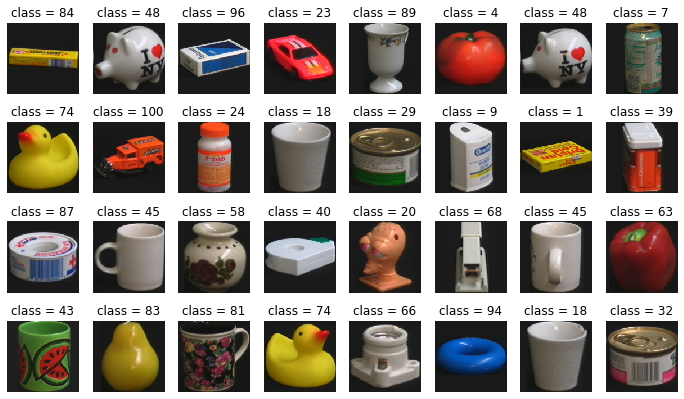

In [3]:
# plot some random images

fig = plt.figure(figsize=(12,7))
for i in range(32):

    r = np.random.randint(0,len(images))
    
    plt.subplot(4,8,i+1)
    plt.axis('off')
    plt.title('class = '+str(classes[r]))
    plt.imshow(images[r])
    
plt.show()

## Bag of Words Features

A Bag of Words description is built in the following way:
    
    1. Detect SIFT features on each of the input images
    2. Cluster *all* SIFT features into a given number of clusters -- note the clustering 
    is in the descriptor dimensions e.g. 128 for SIFT
    3. Build a BoW descriptor for each image by binning detected features to the 
        nearest-neighbour cluster and counting numbers in each cluster
    
The BOW features are a histogram description of the original features in each image. 
Each image will then end up with a single histogram (BOW) with as many bins as
clusters used in Step 2. above.

In theory, the clusters represent higher level local feature groupings which are
discovered by the clustering of all the features over all the images.


## OpenCV Bag-of-Words creator

OpenCV contains a mechanism for creating BOW descriptors by 'training' a BOW method.

The `dictionarySize` argument is the number of clusters (or bins) in the output BOW we
want (normally this is set to be smaller than the input feature dimensionality).

We feed use the `add()` function to add new feature descriptors extracted from each input image.


In [4]:
# try lower contrastThreshold to get some descriptors for each image
sift = cv2.xfeatures2d.SIFT_create(contrastThreshold=0.02,sigma=1.35) # sift engine

descriptors_unclustered = []

dictionarySize = 32 # num words in BoW

bow_trainer = cv2.BOWKMeansTrainer(dictionarySize)

print('Dictionary size is ', dictionarySize)
print('Finding sift features over all the images...')

kps = []
for i in range(len(images)): # over all the images
    
    image = images[i]
    
    # calculate SIFT features on gray-scale version of it
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    kp, desc = sift.detectAndCompute(gray, None)
    
    assert len(kp)>0
    
    kps.append(len(kp)) # so we can do a histogram of kps
    
    # add to the BoW 
    bow_trainer.add(desc)
    
print('Clustering dictionary....this might be slow....')
#dictionary created
dictionary = bow_trainer.cluster()   

print('...done')

Dictionary size is  32
Finding sift features over all the images...
Clustering dictionary....this might be slow....
...done


Number of images run  7200


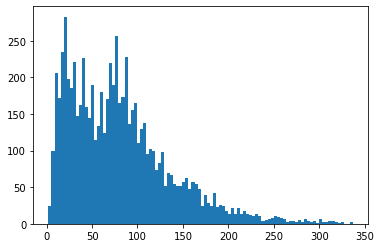

In [5]:
# We can plot a histogram of the numbers of key points which were 
# extracted across all the images
print('Number of images run ', len(kps))

# histogram of numbers of kps 
plt.hist(np.array(kps), bins=100)
plt.show()
    

## OpenCV Bag-of-Words extractor

Once we have a dictionary, we need to use the OpenCV `BOWImgDescriptorExtractor` to 
find the nearest neighbour bins for a given new image. 

Note we can do it for any new image not just the ones used to train the BOW dictionary.

After this process is finished, each input image will have a new BOW feature associated with it. 

In [6]:
# this will help extracts features from a BoW dictionary by using 
# NN to a given image and key points

FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params,search_params)
sift2 = cv2.xfeatures2d.SIFT_create()

bow_extractor = cv2.BOWImgDescriptorExtractor(sift2, cv2.BFMatcher(cv2.NORM_L2))
bow_extractor.setVocabulary(dictionary)

print('bow dictionary', np.shape(dictionary))


# returns descriptor of image at pth
def feature_extract(bow_extractor, sift, image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return bow_extractor.compute(gray, sift.detect(gray))

features = [] # bow features for each image

print('doing bow feature extraction...')
for i in range(len(images)):
    
    bow_feats = feature_extract(bow_extractor, sift, images[i])
    
    features.append(bow_feats)
    
print('...done')

bow dictionary (32, 128)
doing bow feature extraction...
...done


## Plotting BOW features for random images

We can do a plot of the descriptors profiles for sets of images like this...

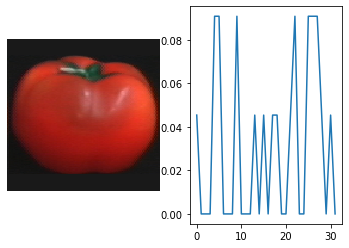

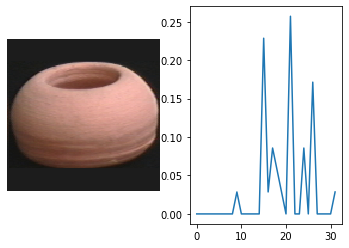

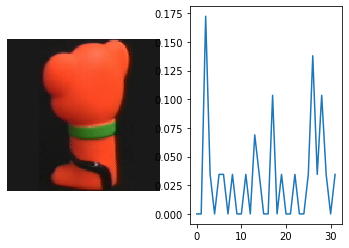

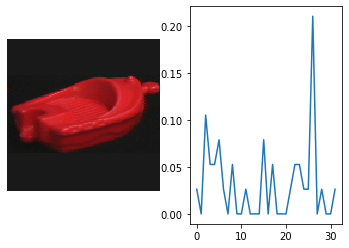

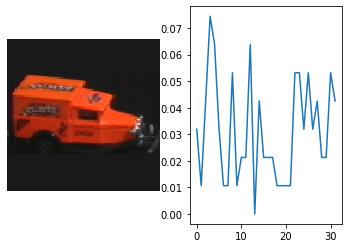

...

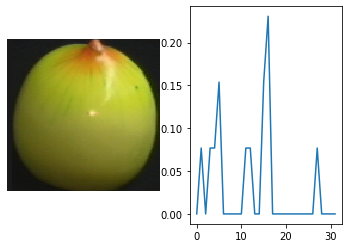

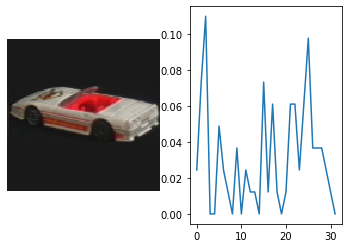

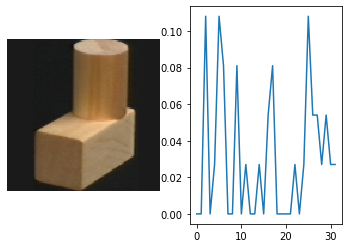

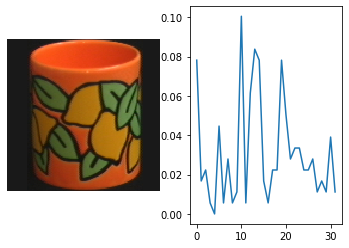

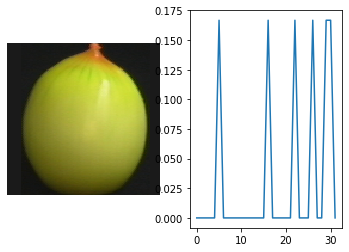

In [7]:
# let's have a look at some

for i in range(30):
    
    k = np.random.randint(0,len(images))
    
    #print(features[k].shape, features[k])
    
    plt.subplot(1,2,1)
    plt.imshow(images[k]), plt.axis('off')
    plt.subplot(1,2,2)
    plt.plot(features[k].T)
    plt.show()
    

## Exercise 1

1. Plot the BOW descriptors for several images of the same class (you can find out which class
an image belongs to by looking in the `classes` list which was created when the images
were first read from file.

2. Plot the average descriptor for the first few classes and compare them with the 
descriptor profiles of images from those classes

3. Calcualte the mean-squared error (MSE) for pairs of BOW descriptors. You can use a function like this which takes two features, `f1` and `f2`:
```
    def mse(f1, f2):
        return np.mean(np.square(f1-f2))
```        

Plot a histogram of *within* and *between* MSE for pairs for feature descritors. Here, *within* is when the two features are from images of the same class, and *between* is when they are from different classes.

4. The MSE is a distances between features and estimates the similarity of two BOW descriptors. Is there a threshold which might allow you to decide if two images belong to the same class?

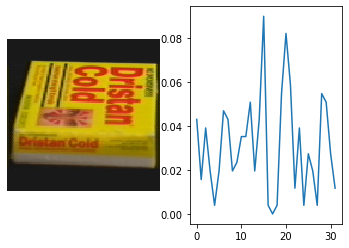

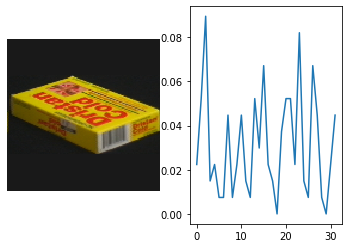

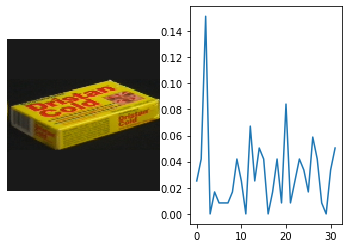

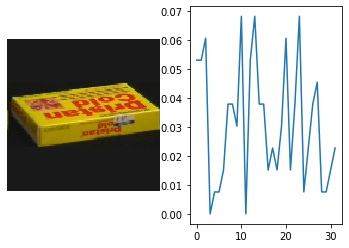

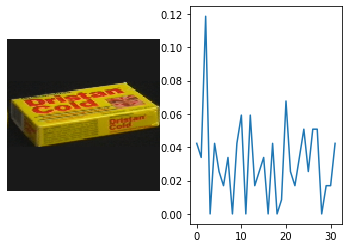

...

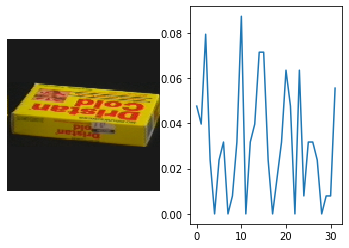

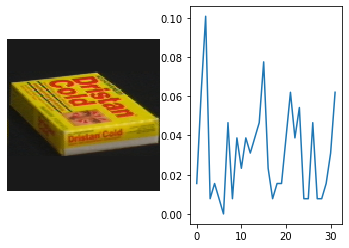

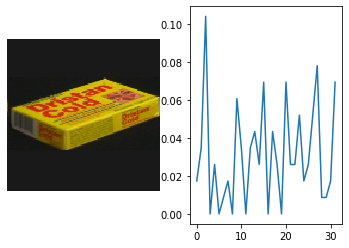

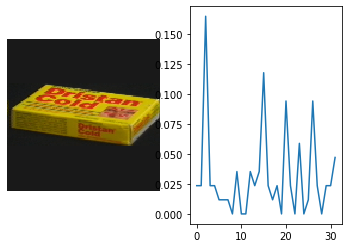

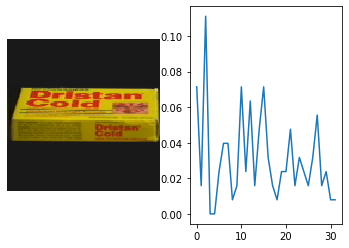

In [8]:
cnum = 1
for i in range (len(images)):
    if classes[i] == cnum:
        plt.subplot(1,2,1)
        plt.imshow(images[i]), plt.axis('off')
        plt.subplot(1,2,2)
        plt.plot(features[i].T)
        plt.show()

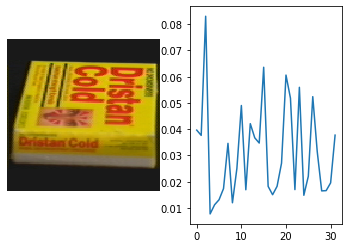

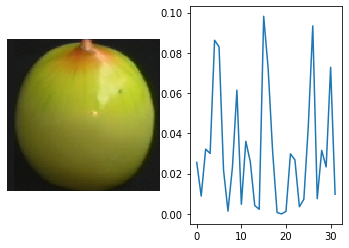

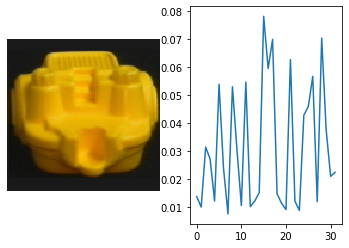

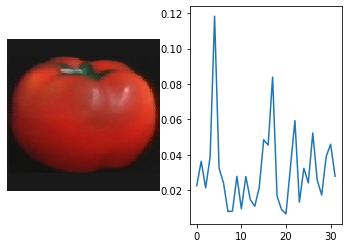

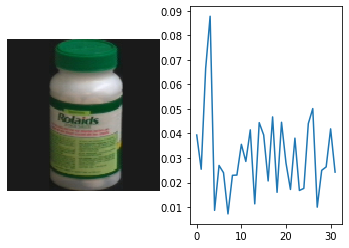

...

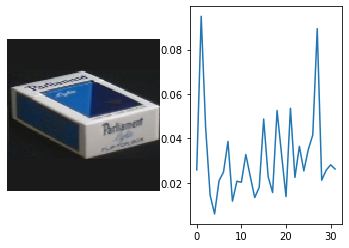

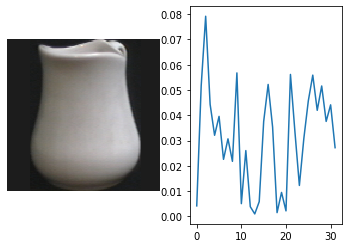

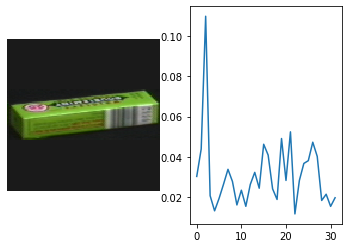

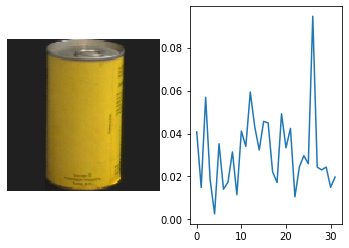

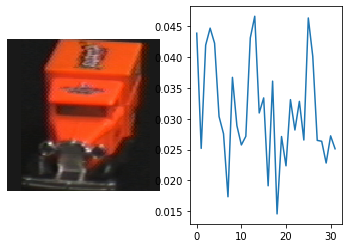

done


In [20]:
for cnum in img_classes.keys():
    avg = np.average(list(map(lambda x: features[x][0], img_classes[cnum])),axis=0)
    plt.subplot(1,2,1)
    plt.imshow(images[img_classes[cnum][0]]), plt.axis('off')
    plt.subplot(1,2,2)
    plt.plot(avg)
    plt.show()
print("done")

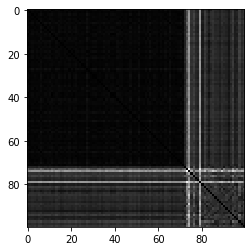

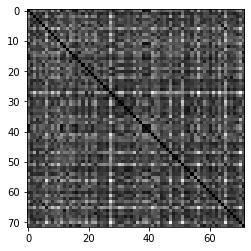

In [26]:
def mse(f1,f2):
    return np.average(np.square(f1-f2))

ims = img_classes[2]
mse_grid = np.zeros((len(ims),len(ims)))
for i in range(len(ims)):
    for j in range(len(ims)):
        mse_grid[i][j] = mse(features[i][0],features[j][0])

imlist = []
for k in img_classes:
    if k==2:
        next
    imlist.append(k)
mse_diff_grid = np.zeros((len(imlist), len(imlist)))
for i in range(len(imlist)):
    for j in range(len(imlist)):
        mse_diff_grid[i][j] = mse(features[i][0],features[j][0])

plt.imshow(mse_diff_grid,cmap="gray")
plt.show()
plt.imshow(mse_grid, cmap="gray")
plt.show()

## Linear Support Vector Machine (SVM) Classification

SVM are well established and widely used classifiers for multi-dimensional feature data. 

The Python `sklearn` package has a interface to run SVM classifiers and we can just use 
it out of the box without knowing exactly how they work.

Like with a lot of Machine Learning methods interfaces in Python, we give it
a set of training data (features and corresponding class labels), and we select a 
flavour of SVM (in this case a `LinearSVC`) and use the corresponding class
`fit()` function to fit our `{X, y}` pairs to build a model.

Then to use the model, we use the `predict()` function by giving it a unknown
feature and asking it to give us its best prediction of class label.

In [27]:
from sklearn import svm

print('Num svm training items ', len(features), len(classes))

# conver to numpy arrays and reshape 
X = np.array(features).reshape(len(features), features[0].shape[1]).astype('float')
y = np.array(classes).reshape(len(classes),1)

print('X has shape ', X.shape, ', y has shape', y.shape)

# define a classifier
clf = svm.LinearSVC()

# fit the data -- this should be really quick
clf.fit(X, y)

Num svm training items  7200 7200
X has shape  (7200, 32) , y has shape (7200, 1)


/local/java/python-pip-packages.cs413/lib64/python3.6/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

### Predicting using the learned classifier and Confusion Matrices

Having got a fitted classifer, we can test it using `predict()`.

Usually we would do this with completely unseen test data, but for simplicity we will
just use samples from our training data.

To assess how good the SVM classifier is, we can compare its prediction with the true
class (for each image BOW feature) and make a *confusion matrix*.

### Confusion Matrices

A confusion matrix is square matrix where each row index is the true class label and 
each column is the predicted class label. We created one by accumulating 1s into 
the matrix:

```
    num_classes = np.max(np.array(classes)) # however many labels we have
    confusion = np.zeros((num_classes, num_classes)) # square matrix 
    
    # make prediction for a given image feature
        confusion[true_class-1, pred_class-1] += 1 # classes labelled from 1
        
```

Note that we need to normalise the rows if we want the confusion matrix to show
accuracies.

In [28]:
num_classes = np.max(np.array(classes))
print('num classes is ', num_classes)

# predict classes from features and 
# compare with the true classes (which we know!) 
confusion = np.zeros((num_classes, num_classes))

for i in range(len(features)):
    true_class = classes[i]
    pred_class = clf.predict(features[i]) # make prediction
        
    #print('true/pred = ', true_class, '/', pred_class)
    confusion[true_class-1, pred_class-1] += 1
    
def normalise_rows(confusion):
    row_sums = confusion.sum(axis=1)
    return confusion / row_sums
    
confusion = 100 * normalise_rows(confusion) # accuracy as a percentage

#confusion = confusion.transpose()
    
# just show the first 10 classes
print('confusion matrix is\n', np.round(confusion[:10,:10],1))

num classes is  100
confusion matrix is
 [[73.6  0.   0.   0.   0.   0.   0.   0.   0.   0. ]
 [ 0.  48.6  1.4  0.   0.   0.   0.   0.   1.4  0. ]
 [ 0.   0.  88.9  0.   0.   0.   1.4  0.   0.   0. ]
 [ 0.   5.6  1.4 23.6  0.   0.   0.   0.   0.   1.4]
 [ 0.   0.   0.   0.  79.2  0.   1.4  0.   1.4  1.4]
 [ 0.   0.   0.   0.   0.  69.4  0.   0.   1.4  1.4]
 [ 0.   0.   0.   0.   0.   0.  95.8  0.   0.   0. ]
 [ 0.   0.   1.4  0.   1.4  2.8  0.  27.8  0.   4.2]
 [ 0.   0.   0.   0.   1.4  0.   0.   0.  45.8  0. ]
 [ 0.   5.6  1.4  0.   0.   0.   1.4  0.   0.  52.8]]


## Exercise 2

1. If we have a perfect classifier, what does the confusion matrix look like?

2. Plot the full confusion matrix as an image.

3. Look carefully at the matrix and find out where two different image types are being 
misclassfied. Look at example images from these and convince yourself why this might be.

4. How do you think we can improve the accuracy of the classifier (think about what features are currently being used and how you might add to them)?

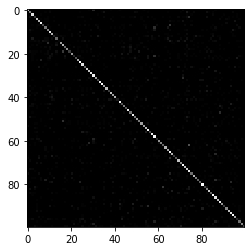

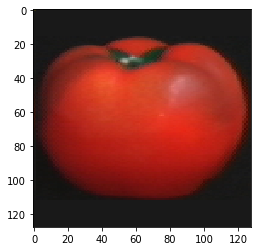

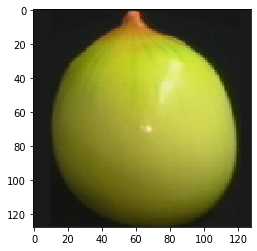

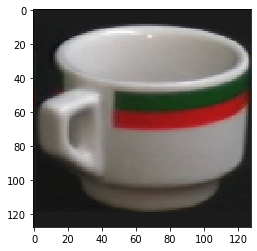

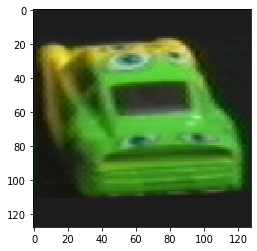

In [34]:
#1 It will reflect the perfection of the classifier by having all zeroes, 
#save for the diagonal (which has length of input image string provided)

plt.imshow(confusion,cmap="gray")
plt.show()

#Each of the specks are misclassifications

#4+2 (tomatoes and onions) are misclassified
plt.imshow(images[img_classes[4][1]])
plt.show()
plt.imshow(images[img_classes[2][1]])
plt.show()

#10+8 (cars and mugs?) are misclassified
plt.imshow(images[img_classes[10][1]])
plt.show()
plt.imshow(images[img_classes[8][1]])
plt.show()

#4 Can improve classification first by adding support for colour
#Can add more features, which ma also improve performance, at cost of postential overfitting, when creating 
#initial SIFT clusters

## Multi-Layer Perceptrons using Keras

In the following, you will investigate whether you can use perform a better
predictor than the SVM using an Artificial Neural Network (ANN). 

In particular, we will start by building Multi-Layer Perceptron (MLP).

The MLP will be designed to input BOW features and output a label class (between 0-99).
So the input dimensionality will be `dictonarySize` and the output dimensionality will
be 100.

Here are the main steps of the method:
    
    1. Declare which Keras libraries we need: which ANN layers, optimizer etc.
    2. Wrangle the data into appropriate normalised input and output arrays {X, y} pairs
    3. Split the data into a training and a validation set
    4. Specify the ANN architecture (build the network and compile it)
    5. Train the network
    
Then we will do as above, which is to evaluate how good the predictor is.

In [35]:
# make some library declarations
import keras

from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam, RMSprop

Using TensorFlow backend.
/local/java/python-pip-packages.cs413/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/local/java/python-pip-packages.cs413/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/local/java/python-pip-packages.cs413/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/loca

### Wrangle the data

We need to make sure that the input range is [0, 1] (which it is for BOW features).

The labels `y` need to be in the range [0,99] so we subtract 1 from `classes`.

We can use the `sklearn.utils.shuffle` to randomize the order of the data and the
corresponding lables.

Finally, we can split the data into a `train` and a `validate` set. We need to do this
for both the `x` and `y` vectors.

In [36]:
num_data = len(images)

x = np.array(features).reshape(num_data, dictionarySize) 
y = np.array(classes)-1 # range needs to be [0,99]

num_classes = np.max(y)+1

print('x shape is ', x.shape)
print('y shape is ', y.shape)
print('num classes is ', num_classes)

# shuffle the data
from sklearn.utils import shuffle
x, y = shuffle(x, y)

# the data, shuffled and split between train and test sets
# do a 70:30 split
num_train = int(70 * num_data/100)
num_validate = num_data - num_train

(x_train, y_train), (x_validate, y_validate) = (x[:num_train,:], y[:num_train]), \
                                       (x[num_train:,:], y[num_train:])

x_train = (x_train - np.min(x))/(np.max(x)-np.min(x)) # normalise the training data
x_validate = (x_validate - np.min(x))/(np.max(x)-np.min(x)) # normalise the validation data

print(x_train.shape[0], 'train samples')
print(x_validate.shape[0], 'test samples')

x shape is  (7200, 32)
y shape is  (7200,)
num classes is  100
5040 train samples
2160 test samples


### One-Hot-Coding

The ANN will produce a vector probabilities (of length 100), where a 1.0 in 
position `c` indicates that class `c` has been predicted.

To train the network, we need to use *one-hot-coding* of our labels `y` before
we can use them to train the network.  This is done by 
```
    y_one_hot = keras.utils.to_categorical(y, num_classes)
    
```

In [37]:
# convert class vectors to binary class matrices
y_train_ohc = keras.utils.to_categorical(y_train, num_classes)
y_validate_ohc = keras.utils.to_categorical(y_validate, num_classes)
print('Num clases is ', num_classes)

print('Example of one-hot-coding: ')
print(y_train_ohc[0])
print(' is class ', y[0])

Num clases is  100
Example of one-hot-coding: 
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]
 is class  90


## Exercise 3

1. Build a MLP with 1 hidden layer (start with 32 neurons)

2. Train your network

3. If the network is overfitting, you may want to some things:
    
    1. change the number of neurons in the hidden layer
    2. try a `Dropout` layer after the hidden layer, e.g. with a dropout rate of 25%
    ~~~~
        mode.add(Dropout(0.25))
    ~~~~
    3. change the batch size
    4. try a smaller learning rate in the optimizer (change the `lr` value)
    
4. If it is not overfitting, can you get it to be more accurate by increasing the number of epochs?

5. Can you get more accuracy by adding a second hidden layer? Does it start to overfit or still work as well?

In [46]:
model = Sequential()
model.add(Dense(32, activation='relu', input_shape=(dictionarySize,)))
model.add(Dense(32, activation='relu'))
model.add(Dense(100, activation='softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history = model.fit(x_train, y_train_ohc,
                    batch_size=5,
                    epochs=100,
                    verbose=1,
                    validation_data=(x_validate, y_validate_ohc))
score = model.evaluate(x_validate, y_validate_ohc, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 5040 samples, validate on 2160 samples
Epoch 1/100
5040/5040 [==============================] - 1s 208us/step - loss: 4.4916 - accuracy: 0.0335 - val_loss: 4.2185 - val_accuracy: 0.0671
Epoch 2/100
5040/5040 [==============================] - 1s 225us/step - loss: 3.8171 - accuracy: 0.1226 - val_loss: 3.5667 - val_accuracy: 0.1426
Epoch 3/100
5040/5040 [==============================] - 1s 202us/step - loss: 3.3285 - accuracy: 0.1885 - val_loss: 3.2858 - val_accuracy: 0.1894
Epoch 4/100
5040/5040 [==============================] - 1s 224us/step - loss: 3.0825 - accuracy: 0.2264 - val_loss: 3.1792 - val_accuracy: 0.2171
Epoch 5/100
5040/5040 [==============================] - 1s 176us/step - loss: 2.9229 - accuracy: 0.2661 - val_loss: 2.9759 - val_accuracy: 0.2500
Epoch 6/100
5040/5040 [==============================] - 1s 213us/step - loss: 2.7865 - accuracy: 0.2861 - val_loss: 2.8860 - val_accuracy: 0.2731
Epoch 7/100
5040/5040 [==============================] - 1s 229us/step

5040/5040 [==============================] - 1s 189us/step - loss: 1.3625 - accuracy: 0.6069 - val_loss: 1.9723 - val_accuracy: 0.5019
Epoch 57/100
5040/5040 [==============================] - 1s 191us/step - loss: 1.3569 - accuracy: 0.6087 - val_loss: 1.8785 - val_accuracy: 0.5111
Epoch 58/100
5040/5040 [==============================] - 1s 244us/step - loss: 1.3447 - accuracy: 0.6103 - val_loss: 1.9162 - val_accuracy: 0.5102
Epoch 59/100
5040/5040 [==============================] - 1s 282us/step - loss: 1.3389 - accuracy: 0.6087 - val_loss: 1.8333 - val_accuracy: 0.5338
Epoch 60/100
5040/5040 [==============================] - 2s 313us/step - loss: 1.3311 - accuracy: 0.6135 - val_loss: 1.8726 - val_accuracy: 0.5282
Epoch 61/100
5040/5040 [==============================] - 1s 244us/step - loss: 1.3308 - accuracy: 0.6187 - val_loss: 1.9268 - val_accuracy: 0.5065
Epoch 62/100
5040/5040 [==============================] - 1s 258us/step - loss: 1.3262 - accuracy: 0.6185 - val_loss: 1.9282 

In [47]:
score = model.evaluate(x_validate, y_validate_ohc, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

ValueError: Error when checking target: expected dense_23 to have shape (100,) but got array with shape (1,)

In [ ]:
# now we can make a simple network
input_shape = (dictionarySize,) # this is the input 'layer'

model = ... # building a layer at a time 

# add a hidden layer here
model.add(...)# try 32, 64, 96 neurons in this layer

# optionally other layers here...but not yet

# output layer should be dense and have a 'softmax' activation
model.add(...) # this is the output

model.summary() 

## Training and fitting

This is how we would compile and fit the model

Note that each time we call `compile()` the weights get re-initialised. 


In [ ]:
# compile and train it!
epochs = ... # 100, 300, 500 you choose
batch_size = ... # 32, 64, 128 you choose

model.compile(loss='categorical_crossentropy',
              optimizer=Adam(), # note default learning rate is lr=1e-3
              metrics=['accuracy'])

history = model.fit(x_train, y_train_ohc,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    validation_data=(x_validate, y_validate_ohc))

## Plotting Training and Validation Accuracy

The `history` return from `fit()` will store the statistics from each epcho and we can
plot these to see whether the validation loss is lower than the training loss (which we want), 
or whether the model is starting to over fit.

In [ ]:
# this plots the change of accuracy and loss over time (stored in the 'history')

print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## Evaluating the trained model

We can see from the validation accuracy on the last epoch how good the model will be.

The `evaluate()` function can give us a score (the loss and the accuracy) like this...

In [ ]:
score = model.evaluate(x_validate, y_validate_ohc, verbose=0)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

## Exercise 4

1. Calculate a second confusion matrix for this model and compare it with the SVM

2. Split your input data into three parts: training, validation and test. Do not use the
    test data for training but to measure the score of a newly trained model.
    
3. Build and train a second MLP with multiple hidden layers and try to optimize the architecture of the network.
What is the best accuracy you can achieve with this new MLP?
